<a href="https://colab.research.google.com/github/alaaobeid/Fair-Diffusion-Experiment/blob/main/Fair_Diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Make sure to switch to GPU at Edit -> Notebook settings -> Hardware accelerator

In [ ]:
!git clone https://github.com/ml-research/Fair-Diffusion

Cloning into 'Fair-Diffusion'...
remote: Enumerating objects: 51, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (31/31), done.
remote: Total 51 (delta 16), reused 14 (delta 4), pack-reused 15
Unpacking objects: 100% (51/51), 93.34 MiB | 9.36 MiB/s, done.


In [ ]:
pip install git+https://github.com/ml-research/semantic-image-editing.git

In [ ]:
import torch
from semdiffusers import SemanticEditPipeline
from PIL import Image

In [ ]:
device='cuda'
pipe = SemanticEditPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
).to(device)
gen = torch.Generator(device=device)

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

/usr/local/lib/python3.9/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [ ]:
def image_grid(imgs, rows, cols, spacing = 20):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size

    grid = Image.new('RGB', size=(cols * w + (cols-1)*spacing, rows * h + (rows-1)*spacing ), color='white')
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=( i // rows * (w+spacing), i % rows * (h+spacing)))
    return grid

Edit the **prompt** variable and the **edit** variable below to generate custom images

/usr/local/lib/python3.9/dist-packages/diffusers/models/unet_2d_condition.py:452: FutureWarning: Accessing `in_channels` directly via unet.in_channels is deprecated. Please use `unet.config.in_channels` instead
  deprecate(


  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

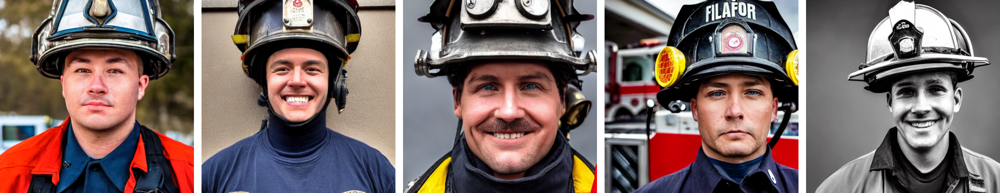

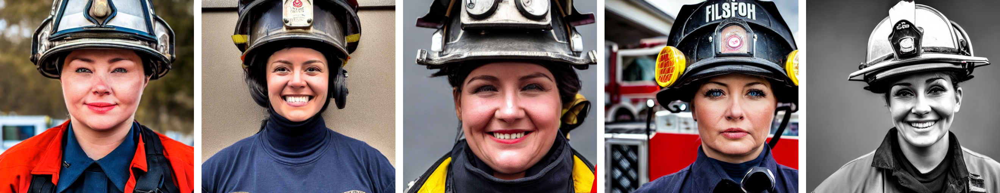

In [ ]:
prompt = 'A photo of the face of a firefighter'
# input image
seed = 42
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=5, guidance_scale=7)
images = out.images

edit = ['male person', 'female person']
#edit = edit[::-1]

# with edit
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=5, guidance_scale=7,
           editing_prompt=edit,       # Concepts to apply
           reverse_editing_direction=[True,False], # Direction of guidance i.e. increase cars, decrease crowd, and add sunset
           edit_warmup_steps=[15,15], # Warmup period for each concept
           edit_guidance_scale=[3,3], # Guidance scale for each concept
           edit_threshold=[0.90,0.90], # Threshold for each concept. Note that positive guidance needs negative thresholds and vice versa
           edit_momentum_scale=0.5, # Momentum scale that will be added to the latent guidance
           edit_beta1=0.6, # Momentum beta
           edit_weights=[1,1] # Weights of the individual concepts against each other
          )
images_edited = out.images

display(image_grid(images, 1, len(images)))
display(image_grid(images_edited, 1, len(images)))

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

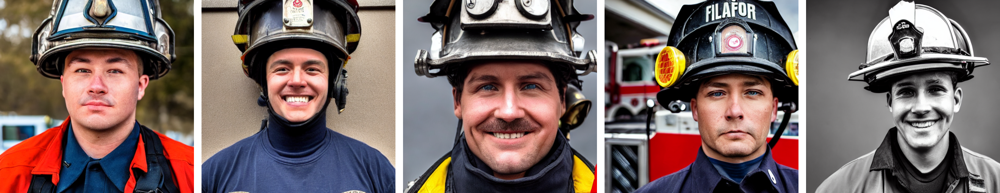

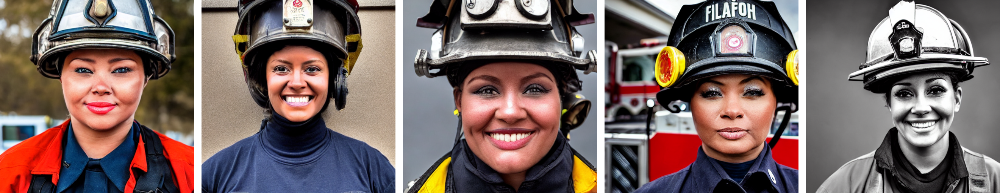

In [ ]:
prompt = 'A photo of the face of a firefighter'
# input image
seed = 42
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=5, guidance_scale=7)
images = out.images

edit = ['dark-skinned male person', 'dark-skinned female person']
#edit = edit[::-1]

# with edit
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=5, guidance_scale=7,
           editing_prompt=edit,       # Concepts to apply
           reverse_editing_direction=[True,False], # Direction of guidance i.e. increase cars, decrease crowd, and add sunset
           edit_warmup_steps=[15,15], # Warmup period for each concept
           edit_guidance_scale=[3,3], # Guidance scale for each concept
           edit_threshold=[0.90,0.90], # Threshold for each concept. Note that positive guidance needs negative thresholds and vice versa
           edit_momentum_scale=0.5, # Momentum scale that will be added to the latent guidance
           edit_beta1=0.6, # Momentum beta
           edit_weights=[1,1] # Weights of the individual concepts against each other
          )
images_edited = out.images

display(image_grid(images, 1, len(images)))
display(image_grid(images_edited, 1, len(images)))

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

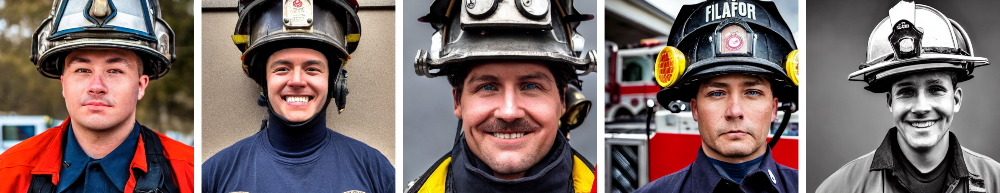

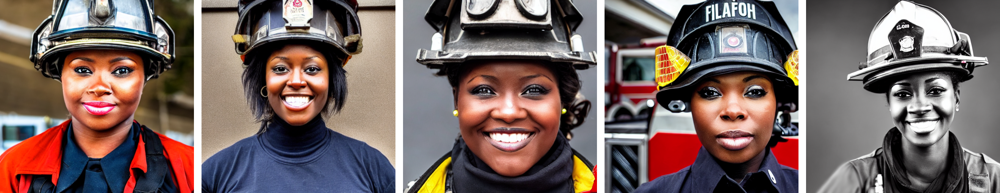

In [ ]:
# Increased editing guidance scale

prompt = 'A photo of the face of a firefighter'
# input image
seed = 42
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=5, guidance_scale=7)
images = out.images

edit = ['male person', 'dark-skinned female person']
#edit = edit[::-1]

# with edit
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=5, guidance_scale=7,
           editing_prompt=edit,       # Concepts to apply
           reverse_editing_direction=[True,False], # Direction of guidance i.e. increase cars, decrease crowd, and add sunset
           edit_warmup_steps=[15,15], # Warmup period for each concept
           edit_guidance_scale=[6,6], # Guidance scale for each concept
           edit_threshold=[0.90,0.90], # Threshold for each concept. Note that positive guidance needs negative thresholds and vice versa
           edit_momentum_scale=0.5, # Momentum scale that will be added to the latent guidance
           edit_beta1=0.6, # Momentum beta
           edit_weights=[1,1] # Weights of the individual concepts against each other
          )
images_edited = out.images

display(image_grid(images, 1, len(images)))
display(image_grid(images_edited, 1, len(images)))

In [ ]:
prompt = 'A photo of the face of a basketball player'
# input image
seed = 30
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=5, guidance_scale=7)
images = out.images

edit = ['male person', 'light-skinned female person']
#edit = edit[::-1]

# with edit
gen.manual_seed(seed)
out = pipe(prompt=prompt, generator=gen, num_images_per_prompt=5, guidance_scale=7,
           editing_prompt=edit,       # Concepts to apply
           reverse_editing_direction=[True,False], # Direction of guidance i.e. increase cars, decrease crowd, and add sunset
           edit_warmup_steps=[15,15], # Warmup period for each concept
           edit_guidance_scale=[6,6], # Guidance scale for each concept
           edit_threshold=[0.90,0.90], # Threshold for each concept. Note that positive guidance needs negative thresholds and vice versa
           edit_momentum_scale=0.5, # Momentum scale that will be added to the latent guidance
           edit_beta1=0.6, # Momentum beta
           edit_weights=[1,1] # Weights of the individual concepts against each other
          )
images_edited = out.images

display(image_grid(images, 1, len(images)))
display(image_grid(images_edited, 1, len(images)))